In [1]:
%reload_ext autoreload
%matplotlib inline
%autoreload 2

In [7]:
import torch
import torch.nn as nn
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import os
import matplotlib.pyplot as plt
import torch.utils.data as data
import torchvision.datasets as datasets
import torchvision.models as models
from PIL import Image
from skimage import io, color
import cv2
import PIL

In [152]:
USE_CUDA = True

In [195]:
pathPic = "./buildings.jpeg.jpg"

In [196]:
pathStyle = "./waves.jpg"

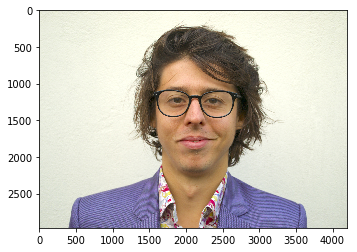

In [256]:
plt.imshow(Image.open(pathPic))

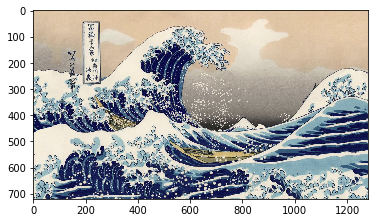

In [257]:
plt.imshow(Image.open(pathStyle))

In [272]:
unloader = transforms.ToPILImage()  # reconvert into PIL image

inv_normalize = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ],
                                                     std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                                transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ],
                                                     std = [ 1., 1., 1. ]),
                               ])
resize = transforms.Resize(1000)


def imshow(tensor, title=None, inv_norm=0):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)# remove the fake batch dimension
    if inv_norm == 1:
        image = inv_normalize(image)
    image = unloader(image)
    image = resize(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated
    
def imagesave(tensor, name):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    image = resize(image)
    image.save(name + ".jpg")



In [259]:
features = models.vgg19(pretrained=True).features

if USE_CUDA:
    features.cuda()


In [260]:
content.size()

torch.Size([1, 3, 512, 512])

In [261]:
transform = transforms.Compose([transforms.Resize(512), transforms.CenterCrop(512), transforms.ToTensor()])

#transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

content = Image.open(pathPic)
style = Image.open(pathStyle)

content = Variable(transform(content).unsqueeze(0))
style = Variable(transform(style).unsqueeze(0))

image = Variable(torch.randn(3, 512,512).unsqueeze(0), requires_grad=True)
                                
assert content.size() == style.size(), \
    "we need style and content images to be same size"

In [262]:
conv_layers = [list(features).index(x) for x in features if isinstance(x, nn.Conv2d)]
content_layer = conv_layers[4]
style_layers = [conv_layers[x] for x in [0,1,2,3,4]]

max_depth = max(max(style_layers), content_layer)

In [263]:
class Loss_content(nn.Module):
    
    def __init__(self, target):
        super().__init__()
        self.target = target.detach()
        
    def forward(self, input):
        self.loss =  F.mse_loss(input, self.target)
        return input

In [264]:
def gram_matrix(matrix):
    
    a,b,c,d = matrix.shape
    gram = matrix * matrix.transpose(2,3)
    gram.div(a * b * c * d)
    
    return gram

In [265]:
def gram_matrix2(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    f = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(f, f.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

In [266]:
class Loss_style(nn.Module):
    
    def __init__(self, target):
        super().__init__()
        self.target = gram_matrix2(target.detach())
    
    def forward(self, input):
        gram_input = gram_matrix2(input)
        self.loss = F.mse_loss(gram_input, self.target)
        return input
        

In [267]:
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = Variable(torch.Tensor(mean).view(-1, 1, 1))
        self.std = Variable(torch.Tensor(std).view(-1, 1, 1))
        if USE_CUDA:
            self.mean = self.mean.cuda()
            self.std = self.std.cuda()

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std

In [268]:
nm = torch.Tensor([0.485, 0.456, 0.406])
nstd = torch.Tensor([0.229, 0.224, 0.225])
normalization = Normalization(nm, nstd)
model = nn.Sequential(normalization)
style_losses = []


if USE_CUDA:
    content = content.cuda()
    style = style.cuda()
    image = image.cuda()
    model = model.cuda()
    normalizaton = normalization.cuda()

for i in range(max_depth + 1):
    
    if isinstance(features[i], nn.ReLU):
        model.add_module("VGG_{}".format(i), nn.ReLU(inplace=False))
    else:
        model.add_module("VGG_{}".format(i), features[i])
    
    if i == content_layer:
        target = model(content).detach()
        model.add_module("LossContent", Loss_content(target))
            
    if i in style_layers:
        target = model(style).detach()
        model.add_module("LossStyle_{}".format(style_layers.index(i) + 1), Loss_style(target))
        

In [269]:
#image = content.clone()
im = nn.Parameter(image.data, requires_grad=True)
optimizer = optim.LBFGS([im])

In [270]:
def train(total_iters, style_weight=1000, content_weight=1):
    
    outputs = []
    res = [0]
    
    iters = [0]
    while iters[0] < total_iters:
        
        im.data.clamp_(0, 1)
        
        def closure():
            
            model(im)
            content_loss = model.LossContent.loss
            style_loss = model.LossStyle_1.loss + model.LossStyle_2.loss
            style_loss += model.LossStyle_3.loss
            style_loss += model.LossStyle_4.loss
            style_loss += model.LossStyle_5.loss
            loss = (style_weight * style_loss)  + (content_weight * content_loss)
            optimizer.zero_grad()
            loss.backward()
            iters[0] += 1
            if iters[0] % 50 == 0:
                print("iter = {}, style loss = {:.3f}, content_loss = {:.3f}".format(iters[0], style_loss.data[0] * style_weight, \
                content_loss.data[0] * content_weight))
                plt.ion()
                figsize= 7, 7
                plt.figure(figsize=figsize)
                outputs.append(im.data.clamp_(0, 1).squeeze(0).cpu())
                imshow(outputs[res[0]], title='Output Image', inv_norm=0)
                plt.ioff()
                plt.show()
                res[0] += 1
            return loss
        
        optimizer.step(closure)
        
    return im.data.clamp_(0, 1), outputs

/home/paperspace/anaconda3/envs/fastai/lib/python3.6/site-packages/ipykernel_launcher.py:24: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


iter = 50, style loss = 39.225, content_loss = 64.792


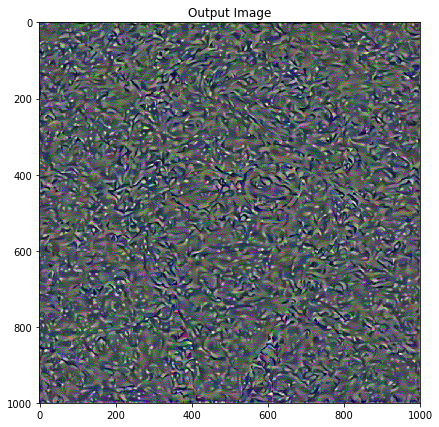

iter = 100, style loss = 17.460, content_loss = 51.987


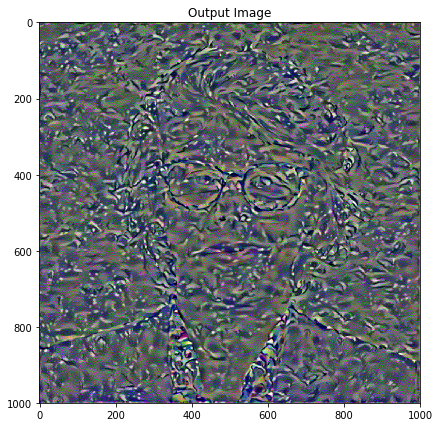

iter = 150, style loss = 12.654, content_loss = 46.599


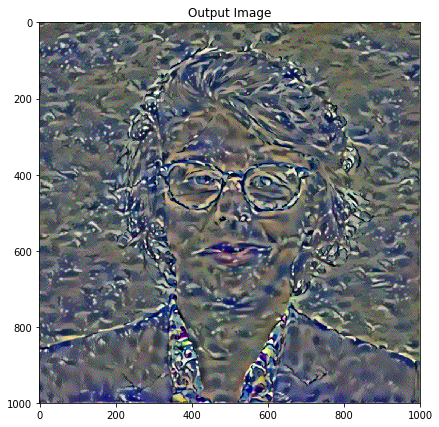

iter = 200, style loss = 9.825, content_loss = 42.523


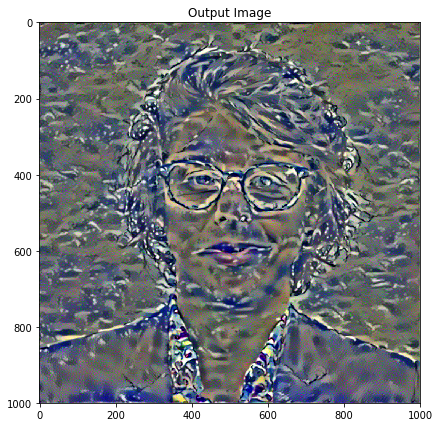

iter = 250, style loss = 8.904, content_loss = 41.061


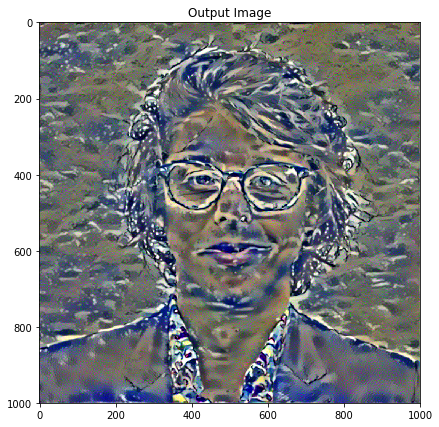

iter = 300, style loss = 8.242, content_loss = 39.977


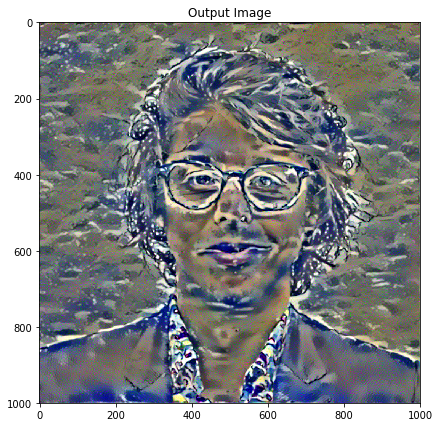

iter = 350, style loss = 7.646, content_loss = 39.046


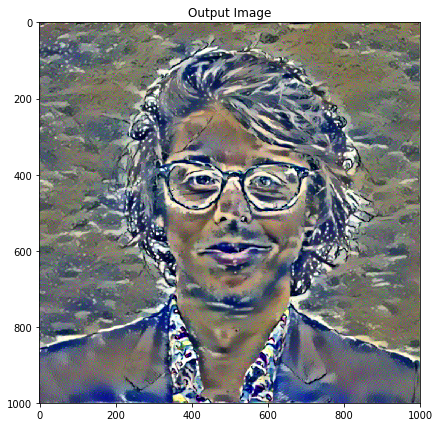

iter = 400, style loss = 6.630, content_loss = 37.461


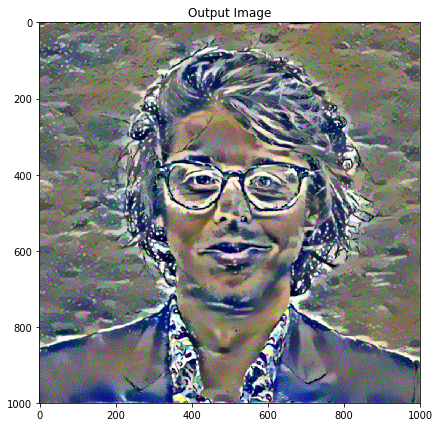

iter = 450, style loss = 17.833, content_loss = 36.068


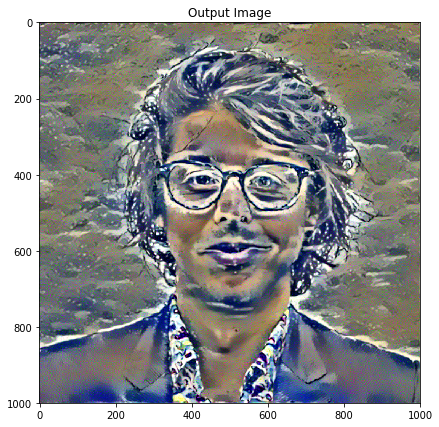

iter = 500, style loss = 6.135, content_loss = 36.890


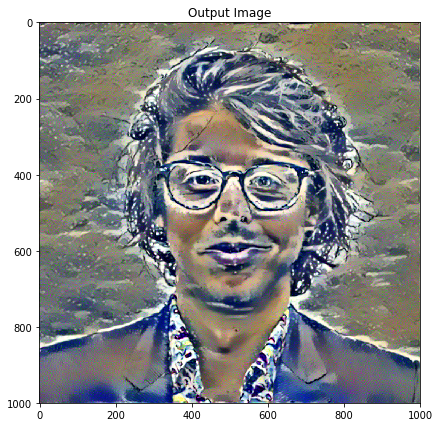

iter = 550, style loss = 6.751, content_loss = 37.362


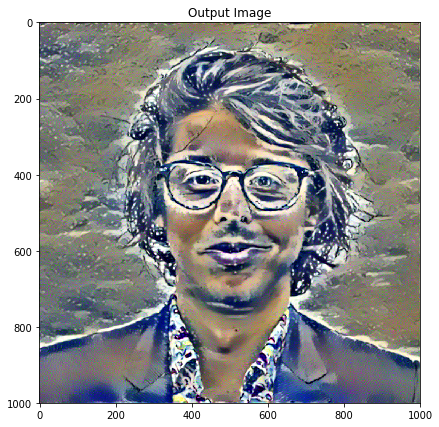

iter = 600, style loss = 5.731, content_loss = 35.977


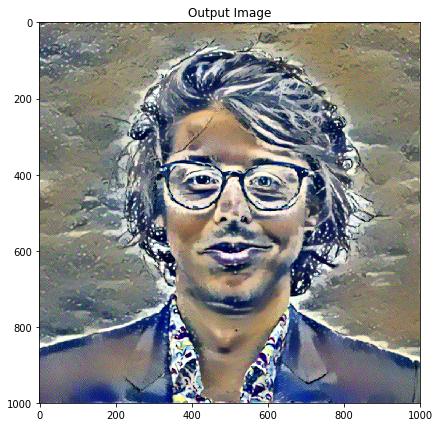

iter = 650, style loss = 7.261, content_loss = 36.332


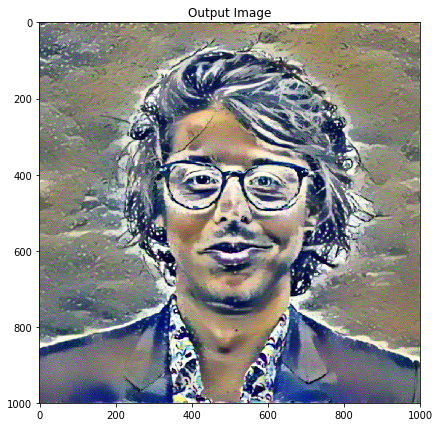

iter = 700, style loss = 5.645, content_loss = 35.674


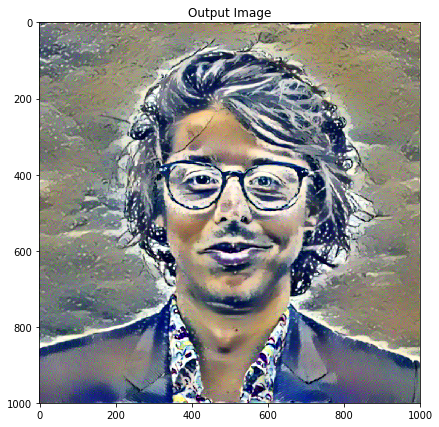

iter = 750, style loss = 9.139, content_loss = 34.953


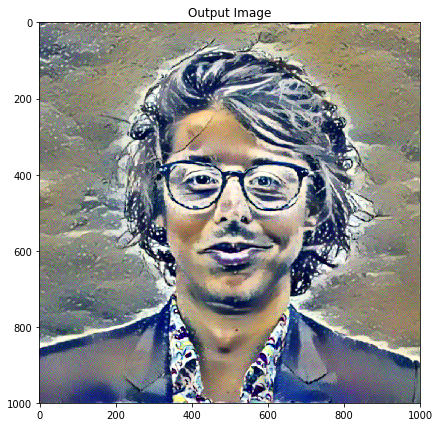

iter = 800, style loss = 5.358, content_loss = 35.770


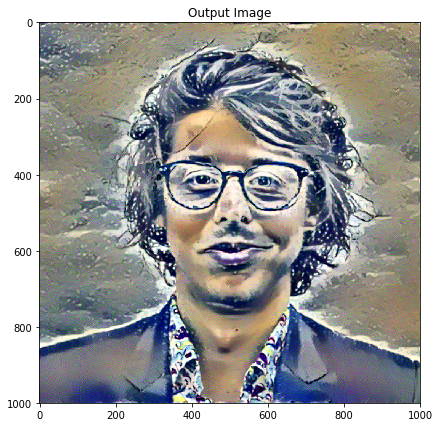

iter = 850, style loss = 5.498, content_loss = 35.041


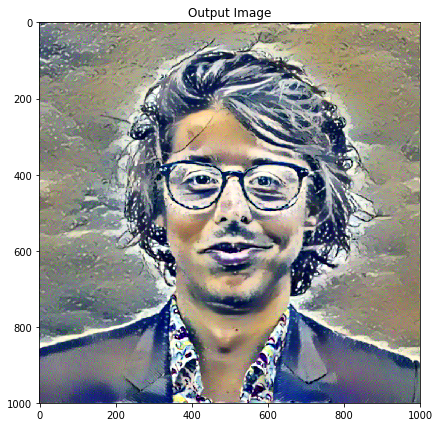

iter = 900, style loss = 5.565, content_loss = 35.162


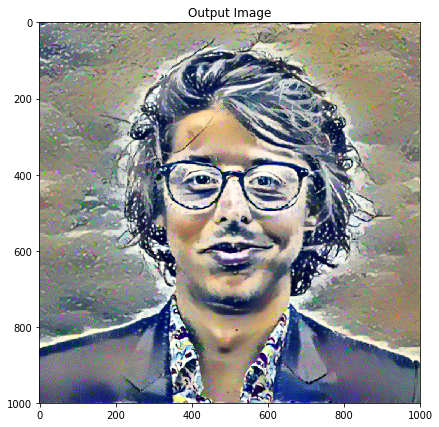

iter = 950, style loss = 5.162, content_loss = 34.769


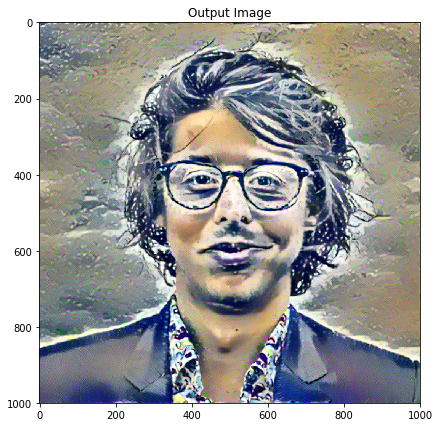

iter = 1000, style loss = 4.909, content_loss = 34.911


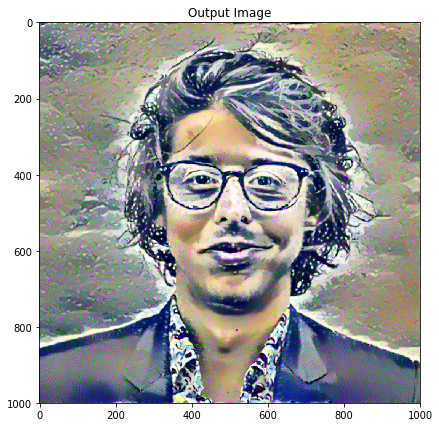

In [271]:
output, outputs = train(1000, 50000, 1)
output = output.squeeze(0)

if USE_CUDA:
    output.cpu()

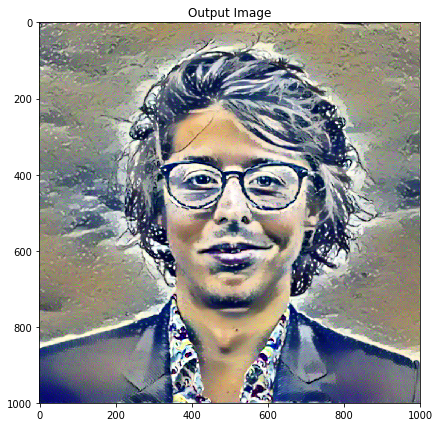

In [252]:
plt.ion()
figsize= 7, 7
plt.figure(figsize=figsize)
imshow(output, title='Output Image', inv_norm=0)
plt.ioff()
plt.show()

In [273]:
imagesave(output, "final")